# Numerical Solution to Schrodinger Equation 
Hasti Hojabr Sadati  \
Student ID : 97216040 \
Professor: Nematollah Riazi \
Quantum Mechanics 2 Project,  Fall 2021 

### Part 2 - Time-dependent One-dimentional Schrodinger Equation Solver

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import warnings
from IPython.display import display, HTML
warnings.filterwarnings("ignore")

In [2]:
def Infinite_square_well(x):
    V=[]
    for i in range(len(x)):
        if i in range(0,len(x)//4): V.append(1e20)
        elif i in range(3*len(x)//4,len(x)): V.append(1e20)
        else : V.append(0)
    return V 

def harmonic_oscillator(x): 
    return 3.5*x**2/2

def Rosen_Morse(x):
    return 6*np.tanh(x)-20*(1/np.cosh(x)**2)

def perturbed_square_well(x):
    V=[]
    for i in range(len(x)):
        if i in range(len(x)//4,2*len(x)//4): V.append(0)
        elif i in range(2*len(x)//4,3*len(x)//4): V.append(40)                  
        else :  V.append(1e8)
    return V

def Barrier(x):
    V=[]
    for i in range(len(x)):
        if i in range(len(x)//4,2*len(x)//4): V.append(40)
        elif i in range(2*len(x)//4,3*len(x)//4): V.append(40)                  
        else :  V.append(0)
    return V

def Arbitary(x): 
    return x**(3)

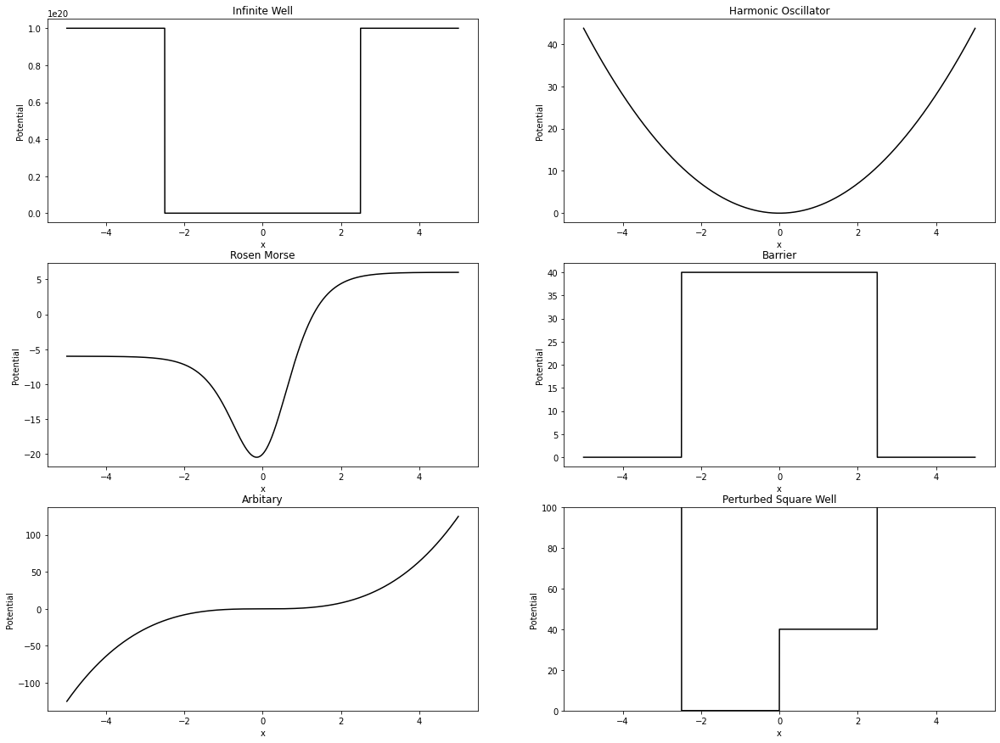

In [101]:
x=np.arange(-5.,5.,0.001)
y=[Infinite_square_well(x),harmonic_oscillator(x),Rosen_Morse(x),Barrier(x),Arbitary(x)]
name=['Infinite Well','Harmonic Oscillator','Rosen Morse','Barrier','Arbitary']
fig = plt.figure(figsize=(20, 15))

for i,ax,n in zip(y,range(1,6),name):
    ax =  fig.add_subplot(3, 2, ax )
    ax.plot(x,i,color = 'k')
    ax.set_xlabel('x')
    ax.set_ylabel('Potential')
    ax.set_title(n)
ax =  fig.add_subplot(3, 2, 6 )
ax.plot(x,perturbed_square_well(x),color = 'k')
ax.set_xlabel('x')
ax.set_ylabel('Potential')
ax.set_title('Perturbed Square Well')
plt.ylim(0, 100)
plt.show()

In [6]:
import matplotlib.animation as animation
import scipy.integrate

In [7]:
def oneD_Schrödinger_timedependent(potential,name,crop1,crop2):

    dx,dt = 0.01, 0.001 # Lenght of spatial step , lenght of time step
    xLeft,xRight = -1,1
    x = np.arange(xLeft,xRight, dx)
    Nx, Nt = len(x) ,100 # Number of spatial steps , # Number of time steps
    x0,k0,sigma = 0,0,0.05 #initial wave parameters
     
    def Initial_Gaussian(k0,sigma,x0): #intial wave
        return np.exp(-(x-x0)**2/(2*sigma**2)) * np.exp(1j*x*k0) 

    def Crank_Nicolson(V,sigma,k0,x0,Nx,dx):

        psi    = np.zeros((Nt, Nx), dtype=complex)
        psi[0] = Initial_Gaussian(k0,sigma,x0) 
        norm = scipy.integrate.trapz(abs(psi[0])**2,dx)
        psi = psi/norm # Normalisation
        
        # Hamiltonian as a sparse matrix (Eq.33)
        I = np.identity(Nx)
        H = -(np.diag(np.full(Nx,-2))+np.diag(np.ones(Nx-1),1)+np.diag(np.ones(Nx-1),-1))/dx**2 + V*I
        left = I + H*1j*dt/2
        
        for t in range(Nt-1):
            right = (I - H*1j*dt/2).dot(psi[t])   #left = right (Eq.34)
            psi[t+1] = np.linalg.solve(left, np.real(right)) + 1.j*np.linalg.solve(left, np.imag(right))
        return psi

    def animate(t):
        psi2.set_ydata(np.absolute(psi[t])**2)
        imaginary.set_ydata(np.imag(psi[t]))
        real.set_ydata(np.real(psi[t]))
        return psi2,imaginary,real

    def init():
        psi2.set_ydata(np.array(x))
        imaginary.set_ydata(np.array(x))
        real.set_ydata(np.array(x))
        return psi2,imaginary,real

    V   = potential(x)
    psi = Crank_Nicolson(V,sigma,k0,x0,Nx,dx)

    fig, ax    = plt.subplots(figsize=(10, 6))
    psi2,      = ax.plot(x, abs(psi[0,:])**2, label='|\u03C8(x)|^2',color='k')
    imaginary, = ax.plot(x, np.imag(psi[0,:]), label='imagenery',color='b')
    real,      = ax.plot(x, np.real(psi[0,:]), label='real',color='orange')
    plt.plot(x, V, c='r', label='$V(x)$')

    plt.xlabel('x')
    plt.title(name)
    plt.ylim(crop1, crop2)
    plt.legend(loc='upper left')
    plt.close(fig)

    Animation = animation.FuncAnimation(fig, animate, frames=Nt, init_func=init, interval=100, blit=True)
    return HTML(Animation.to_jshtml())


In [8]:
oneD_Schrödinger_timedependent(Barrier,'Barrier',-5,60)

In [89]:
oneD_Schrödinger_timedependent(perturbed_square_well,'Asymmetric Square Well',-10,200)

In [181]:
def harmonic_oscillator(x): 
    return 70*x**2/2
oneD_Schrödinger_timedependent(harmonic_oscillator,'Harmonic oscillator',-10,20)

In [154]:
from platform import python_version

print(python_version())

3.8.5


In [157]:
print('Pandas Version',pd.__version__)
print('Numpy Version',np.__version__)
print('scipy Version',scipy.__version__)
print('matplotlib Version',matplotlib.__version__)

Pandas Version 1.1.3
Numpy Version 1.21.5
scipy Version 1.5.2
matplotlib Version 3.3.2
